In [24]:
import numpy as np
import soundfile as sf
from funcs.gcc import gcc_phat

# Load audio
file_path = "Recordings/example_mixture.wav" 
signal, sr = sf.read(file_path)

print("Shape:", signal.shape)   # should be (N, 4)
print("Sample rate:", sr)

# Ensure it's 4-channel
assert signal.ndim == 2 and signal.shape[1] == 4, "Expected 4-channel audio"

# Normalize (per channel)
signal_norm = signal / np.max(np.abs(signal), axis=0, keepdims=True)

# Optional: check levels
print("Max per channel:", np.max(np.abs(signal_norm), axis=0))

Shape: (926100, 4)
Sample rate: 44100
Max per channel: [1. 1. 1. 1.]


In [25]:
import numpy as np
import scipy.signal as signal
from scipy.io import wavfile

def gcc_phat(sig, refsig, fs=44100, max_tau=None, interp=16):
    """
    Beregner tidsforsinkelsen (TDOA) mellem to signaler vha. GCC-PHAT.
    """
    n = sig.shape[0] + refsig.shape[0]
    # Fourier Transform af begge signaler
    SIG = np.fft.rfft(sig, n=n)
    REFSIG = np.fft.rfft(refsig, n=n)
    
    # Beregn cross-power spectrum og normalisér fasen (PHAT)
    R = SIG * np.conj(REFSIG)
    cc = np.fft.irfft(R / (np.abs(R) + 1e-10), n=(interp * n))
    
    # Find peaket i korrelationen
    max_shift = int(interp * n / 2)
    if max_tau:
        max_shift = int(max_tau * fs * interp)
    
    cc = np.concatenate((cc[-max_shift:], cc[:max_shift+1]))
    shift = np.argmax(np.abs(cc)) - max_shift
    
    return shift / (interp * fs)

# 1. Indlæs den 4-kanals WAV-fil fra casen [cite: 19]
# Kanal rækkefølge: [left_front, left_rear, right_front, right_rear]
fs, data = wavfile.read('Recordings/example_mixture.wav')
lf, lr, rf, rr = data[:, 0], data[:, 1], data[:, 2], data[:, 3]

# 2. Analysér Venstre vs. Højre (Interaural Time Difference)
# Dette fortæller os om lyden er til 90° eller 270° 
tdoa_lr = gcc_phat(lf, rf, fs=fs)
print(f"TDOA Venstre/Højre: {tdoa_lr:.6f} sek")

# 3. Analysér Front vs. Bag (Internal Microphone Difference)
# Dette afgør om lyden er 0° (front) eller 180° (rear) [cite: 35, 40]
tdoa_fb = gcc_phat(lf, lr, fs=fs)
print(f"TDOA Front/Bag: {tdoa_fb:.6f} sek")

TDOA Venstre/Højre: 0.000000 sek
TDOA Front/Bag: 0.000001 sek


In [16]:
import numpy as np

def analyze_spatial_energy(data, window_sec=0.5, fs=44100):
    # Konvertér til float og normalisér hvis nødvendigt
    if data.dtype != np.float32 and data.dtype != np.float64:
        data = data.astype(np.float64) / 32768.0  # Normalisér 16-bit PCM
    
    window_samples = int(window_sec * fs)
    n_windows = data.shape[0] // window_samples
    
    results = []
    for i in range(n_windows):
        segment = data[i*window_samples : (i+1)*window_samples, :]
        
        # RMS beregning med sikkerhedsmargin
        rms = np.sqrt(np.mean(np.square(segment), axis=0) + 1e-12)
        
        # Ratio beregninger (samme som før)
        left_avg = (rms[0] + rms[1]) / 2
        right_avg = (rms[2] + rms[3]) / 2
        lr_ratio = 20 * np.log10(left_avg / (right_avg + 1e-10))
        
        front_avg = (rms[0] + rms[2]) / 2
        rear_avg = (rms[1] + rms[3]) / 2
        fb_ratio = 20 * np.log10(front_avg / (rear_avg + 1e-10))
        
        results.append([lr_ratio, fb_ratio])
        
    return np.array(results)
# Kør analysen
spatial_map = analyze_spatial_energy(data, fs=fs)

# Logik til din rapport:
# Hvis lr_ratio > 3dB  -> Taleren er til venstre (ca. 270°)
# Hvis lr_ratio < -3dB -> Taleren er til højre (ca. 90°)
# Hvis fb_ratio > 2dB  -> Taleren er foran (ca. 0°)
# Hvis fb_ratio < -2dB -> Taleren er bagved (ca. 180°)

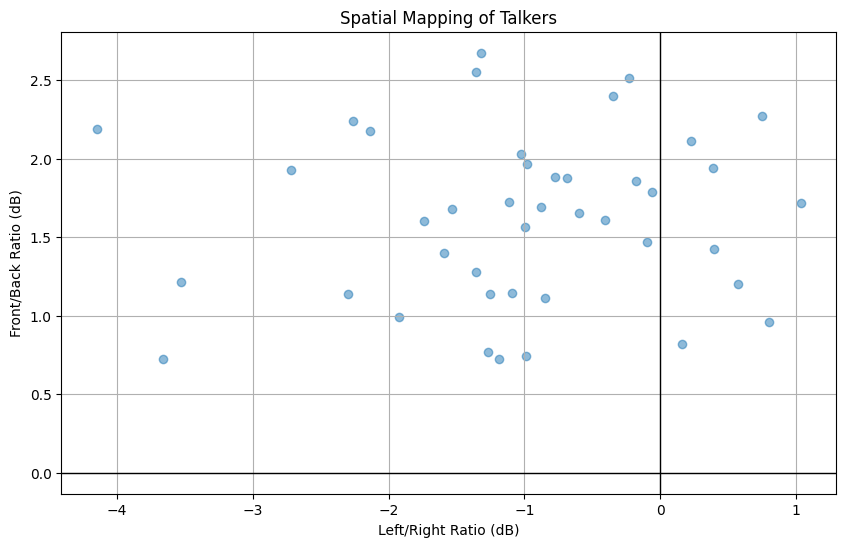

In [17]:

import matplotlib.pyplot as plt
# spatial_map indeholder [lr_ratio, fb_ratio]
lr_ratios = spatial_map[:, 0]
fb_ratios = spatial_map[:, 1]

plt.figure(figsize=(10, 6))
plt.scatter(lr_ratios, fb_ratios, alpha=0.5)
plt.axhline(0, color='black', lw=1)
plt.axvline(0, color='black', lw=1)
plt.xlabel('Left/Right Ratio (dB)')
plt.ylabel('Front/Back Ratio (dB)')
plt.title('Spatial Mapping of Talkers')
plt.grid(True)
plt.show()

In [ ]:
import numpy as np
from scipy.io import wavfile
import IPython.display as ipd

# Indlæs data
fs, data = wavfile.read('Recordings/example_mixture.wav')
data = data.astype(np.float32) / 32768.0

def listen_to_angle(angle_name):
    if angle_name == "front":
        # Fokus på 0° ved at lægge begge front-mikrofoner sammen [cite: 35]
        signal = (data[:, 0] + data[:, 2]) / 2
    elif angle_name == "rear":
        # Fokus på 180° ved at bruge bag-mikrofonerne [cite: 34, 35]
        signal = (data[:, 1] + data[:, 3]) / 2
    elif angle_name == "left":
        # Fokus på 270° (venstre øre) [cite: 35, 40]
        signal = (data[:, 0] + data[:, 1]) / 2
    elif angle_name == "right":
        # Fokus på 90° (højre øre) [cite: 40]
        signal = (data[:, 2] + data[:, 3]) / 2
    
    print(f"Afspiller fokus: {angle_name}")
    return ipd.Audio(signal, rate=fs)

# Kør disse i hver sin celle for at lytte:
#listen_to_angle("front")
#listen_to_angle("rear")
listen_to_angle("left")
# listen_to_angle("right")

Afspiller fokus: left


In [19]:
import numpy as np
import IPython.display as ipd

def listen_super_directional(target="front"):
    # Antag en lille delay svarende til afstanden mellem mikrofonerne (ca. 1-2 samples)
    delay = 1 
    
    if target == "front":
        # Front minus tidsforskudt bag-mikrofon (fjerner lyd bagfra)
        # Vi gør det for begge ører og lægger dem sammen
        left = data[delay:, 0] - data[:-delay, 1]
        right = data[delay:, 2] - data[:-delay, 3]
        signal = (left + right) / 2
    elif target == "rear":
        # Bag minus tidsforskudt front-mikrofon (fjerner lyd forfra)
        left = data[delay:, 1] - data[:-delay, 0]
        right = data[delay:, 3] - data[:-delay, 2]
        signal = (left + right) / 2
    elif target == "left":
        # Venstre øre minus højre øre (fjerner lyd fra højre side)
        signal = (data[:, 0] + data[:, 1]) - (data[:, 2] + data[:, 3])
    elif target == "right":
        # Højre øre minus venstre øre (fjerner lyd fra venstre side)
        signal = (data[:, 2] + data[:, 3]) - (data[:, 0] + data[:, 1])

    return ipd.Audio(signal, rate=fs)

# Prøv at køre denne og lyt specifikt efter den ENGELSKE taler:
listen_super_directional("right")

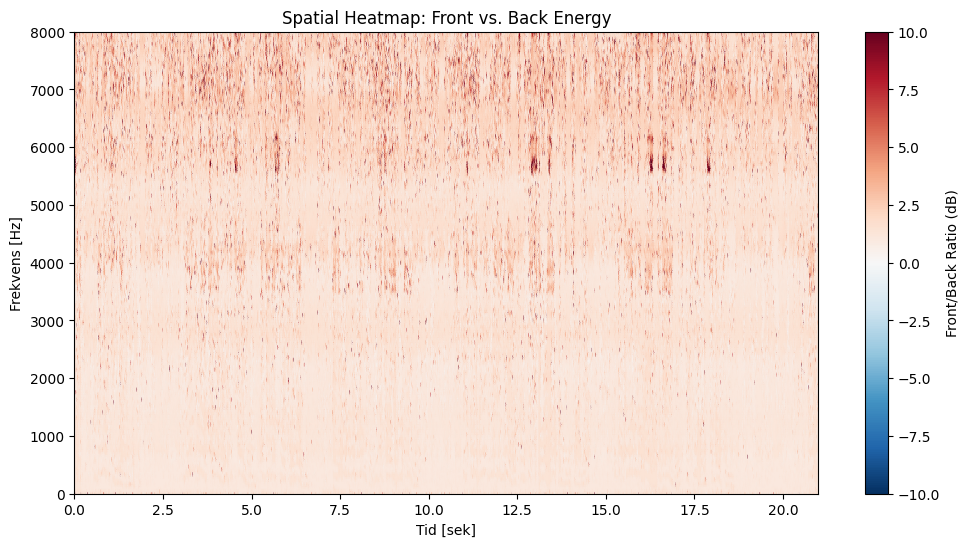

In [20]:
def get_spatial_masks(data, fs):
    # FFT for at arbejde i frekvensdomænet (bedre til tale)
    f, t, Zxx = signal.stft(data.T, fs, nperseg=1024) 
    # Zxx har formen (4, frekvens, tid) -> [lf, lr, rf, rr]

    # Beregn energiforskelle per frekvensbånd
    # Front vs Bag (FB)
    fb_map = np.abs(Zxx[0] + Zxx[2]) / (np.abs(Zxx[1] + Zxx[3]) + 1e-10)
    
    # Venstre vs Højre (LR)
    lr_map = np.abs(Zxx[0] + Zxx[1]) / (np.abs(Zxx[2] + Zxx[3]) + 1e-10)


    rear_mask = fb_map < 1.2 # Justér tallet til du hører noget
    Zxx_rear_only = Zxx * rear_mask

    # Inverter STFT for at få lyd tilbage
    _, clean_rear = signal.istft(Zxx_rear_only, fs)
    return f, t, fb_map, lr_map, clean_rear

f, t, fb_map, lr_map, clean_rear = get_spatial_masks(data, fs)
# 4. Visualisering med Heatmap
plt.figure(figsize=(12, 6))
# Vi begrænser frekvensaksen til 0-8000 Hz, da det meste tale ligger her
plt.pcolormesh(t, f, fb_map, shading='gouraud', cmap='RdBu_r', vmin=-10, vmax=10)
plt.title('Spatial Heatmap: Front vs. Back Energy')
plt.ylabel('Frekvens [Hz]')
plt.xlabel('Tid [sek]')
plt.ylim(0, 8000) 
colorbar = plt.colorbar(label='Front/Back Ratio (dB)')
plt.show()

In [13]:
import numpy as np
import scipy.signal as signal
from scipy.io import wavfile
import IPython.display as ipd

fs, data = wavfile.read('Recordings/example_mixture.wav')
data = data.astype(np.float32) / 32768.0
alpha = 0.5

f, t, Zxx = signal.stft(data.T, fs, nperseg=1024)
fb_map = np.abs(Zxx[2] + Zxx[3]) / (np.abs(Zxx[0] + Zxx[1]) + 1e-10)

rear_mask = fb_map < 0.9
Zxx_rear_only = Zxx * rear_mask

_, clean_rear = signal.istft(Zxx_rear_only, fs)

ipd.Audio(clean_rear, rate=fs)


In [24]:


import numpy as np
import scipy.signal as signal

def isolate_angle(audio, fs, target_angle_deg, tolerance_deg=20, nperseg=1024):
    """
    Isolate sound coming from a given angle using ratio masking.

    Parameters:
    - audio: np.ndarray of shape (samples, 4)
    - fs: sampling rate
    - target_angle_deg: desired angle (0 = front, 90 = left, etc.)
    - tolerance_deg: angular width of mask
    - nperseg: STFT window size

    Returns:
    - mono signal of isolated audio
    """

    # --- STFT ---
    f, t, Zxx = signal.stft(audio.T, fs, nperseg=nperseg)

    # --- Ratios ---
    fb_ratio = (np.abs(Zxx[0]) + np.abs(Zxx[2])) / (np.abs(Zxx[1]) + np.abs(Zxx[3]) + 1e-10)
    lr_ratio = (np.abs(Zxx[0]) + np.abs(Zxx[1])) / (np.abs(Zxx[2]) + np.abs(Zxx[3]) + 1e-10)

    # --- Convert to angles ---
    target_angle = np.deg2rad(target_angle_deg)
    tolerance = np.deg2rad(tolerance_deg)

    angle_est = np.arctan2(fb_ratio - 1, lr_ratio - 1)
    angle_est = angle_est - np.pi / 2
    angle_diff = np.angle(np.exp(1j * (angle_est - target_angle)))

    # --- Mask ---
    mask = np.abs(angle_diff) < tolerance

    # --- Apply mask ---
    Zxx_masked = Zxx * mask

    # --- Inverse STFT ---
    _, reconstructed = signal.istft(Zxx_masked, fs)

    # --- Convert to mono ---
    mono = np.mean(reconstructed, axis=0)

    return mono
fs, data = wavfile.read('Recordings/example_mixture.wav')
data = data.astype(np.float32) / 32768.0
isolated_audio = isolate_angle(data, fs, target_angle_deg=90)

ipd.Audio(isolated_audio, rate=fs)

In [27]:
import numpy as np
import scipy.signal as signal
import whisper

def isolate_angle(
    audio,
    fs,
    target_angle_deg,
    tolerance_deg=20,
    nperseg=1024,
    angle_offset_deg=90,
    soft_mask=True,
    sharpness=8.0,
    energy_floor=0.01,
    flip_lr=False,
    flip_fb=False,
):
    """
    Isolate sound coming from a target angle using ratio-based masking.

    Parameters
    ----------
    audio : np.ndarray
        Shape (samples, 4)
    fs : int
        Sampling rate
    target_angle_deg : float
        Desired direction in degrees:
        0 = front, 90 = left, 180 = back, 270 = right
    tolerance_deg : float
        Angular width around the target
    nperseg : int
        STFT window size
    angle_offset_deg : float
        Rotation used to align estimated angles with physical angles
    soft_mask : bool
        If True, use a smooth mask. If False, use hard thresholding
    sharpness : float
        Controls how steep the soft mask is
    energy_floor : float or None
        Ignore very weak TF bins. Set None to disable
    flip_lr : bool
        Flip left/right axis if needed
    flip_fb : bool
        Flip front/back axis if needed

    Returns
    -------
    mono : np.ndarray
        Isolated mono signal
    """

    # Ensure float
    audio = audio.astype(np.float32)

    # STFT: result shape is (channels, freqs, frames)
    _, _, Zxx = signal.stft(audio.T, fs=fs, nperseg=nperseg)

    # Magnitudes
    mag = np.abs(Zxx)

    # Example ratio features
    fb_ratio = (mag[0] + mag[2]) / (mag[1] + mag[3] + 1e-10)
    lr_ratio = (mag[0] + mag[1]) / (mag[2] + mag[3] + 1e-10)

    # Center around 0 so ratio=1 means neutral
    fb_feat = fb_ratio - 1.0
    lr_feat = lr_ratio - 1.0

    # Optional axis flips
    if flip_fb:
        fb_feat = -fb_feat
    if flip_lr:
        lr_feat = -lr_feat

    # Estimated angle
    angle_est = np.arctan2(fb_feat, lr_feat)

    # Rotate so 0 degrees corresponds to "front"
    angle_est = angle_est - np.deg2rad(angle_offset_deg)

    # Target angle
    target_angle = np.deg2rad(target_angle_deg)
    tolerance = np.deg2rad(tolerance_deg)

    # Wrapped angle difference in [-pi, pi]
    angle_diff = np.angle(np.exp(1j * (angle_est - target_angle)))

    # Build angular mask
    if soft_mask:
        # Gaussian-like soft mask
        mask = np.exp(-0.5 * (angle_diff / tolerance) ** 2)
        # Optional sharpening
        mask = mask ** sharpness
    else:
        mask = (np.abs(angle_diff) < tolerance).astype(np.float32)

    # Confidence / energy gating
    if energy_floor is not None:
        energy = np.mean(mag, axis=0)   # shape (freqs, frames)
        energy_mask = (energy > energy_floor).astype(np.float32)
        mask = mask * energy_mask

    # Apply same mask to all channels
    Zxx_masked = Zxx * mask[None, :, :]

    # Invert
    _, reconstructed = signal.istft(Zxx_masked, fs=fs)

    # Reconstructed shape: (channels, samples)
    mono = np.mean(reconstructed, axis=0)

    return mono

fs, data = wavfile.read("Recordings/example_mixture.wav")
data = data.astype(np.float32) / 32768.0

isolated_audio = isolate_angle(
    data,
    fs,
    target_angle_deg=0,
    tolerance_deg=25,
    angle_offset_deg=90,
    soft_mask=False,
    sharpness=8,
    energy_floor=0.005
)

ipd.Audio(isolated_audio, rate=fs)

model = whisper.load_model("base")
result = model.transcribe(isolated_audio, fp16=False)
print(result["text"])

 Thế trường xa hết valoured pl Jabê 안돼 như cô why? Phó çal tu đельзя Imitrans tranh ph суп ph Kick Phul B포, cybersecurity alert Thamilygal fried Ba nice


In [52]:
import numpy as np
import scipy.signal as signal

def isolate_angle_consistent(audio, fs, target_angle_deg, tolerance_deg=20, nperseg=1024):
    """
    Isolate sound from any angle using directional scores that are
    consistent with the simple front/back/left/right masks.

    Angle convention:
        0   = front
        90  = left
        180 = back
        270 = right
    """

    eps = 1e-10
    audio = audio.astype(np.float32)

    # STFT: shape (channels, freqs, frames)
    _, _, Zxx = signal.stft(audio.T, fs=fs, nperseg=nperseg)
    mag = np.abs(Zxx)

    # --- Define pair energies ---
    # These follow your earlier logic. Adjust if your channel geometry differs.
    front_energy = mag[0] + mag[1]
    back_energy  = mag[2] + mag[3]

    left_energy  = mag[0] + mag[2]
    right_energy = mag[1] + mag[3]

    # --- Signed directional scores ---
    fb_score = np.log((front_energy + eps) / (back_energy + eps))
    lr_score = np.log((left_energy + eps) / (right_energy + eps))

    # --- Angle estimate ---
    # atan2(y, x) -> here:
    # x = front/back axis, y = left/right axis
    angle_est = np.arctan2(lr_score, fb_score)

    # rotate coordinate system
    angle_est = angle_est - np.deg2rad(90)

    angle_est = np.mod(angle_est, 2 * np.pi)

    target_angle = np.deg2rad(target_angle_deg)
    tolerance = np.deg2rad(tolerance_deg)

    # shortest wrapped angle difference
    angle_diff = np.angle(np.exp(1j * (angle_est - target_angle)))

    # hard mask, like your simple version
    mask = np.abs(angle_diff) < tolerance

    # apply same mask to all 4 channels
    Zxx_masked = Zxx * mask[None, :, :]

    # inverse STFT
    _, reconstructed = signal.istft(Zxx_masked, fs=fs)

    # mono output
    mono = np.mean(reconstructed, axis=0)

    return mono, reconstructed

def spectral_denoise(audio, fs, nperseg=1024, noise_percentile=10, reduction_strength=1.0):
    """
    Simple spectral gating noise reduction.

    Parameters:
    - audio: mono signal
    - fs: sampling rate
    - noise_percentile: lower percentile = assumed noise floor
    - reduction_strength: how aggressively to suppress noise

    Returns:
    - denoised audio
    """

    # STFT
    f, t, Zxx = signal.stft(audio, fs, nperseg=nperseg)
    magnitude = np.abs(Zxx)
    phase = np.angle(Zxx)

    # Estimate noise floor per frequency bin
    noise_floor = np.percentile(magnitude, noise_percentile, axis=1, keepdims=True)

    # Create mask
    mask = magnitude > (noise_floor * reduction_strength)

    # Soft mask (better than hard)
    soft_mask = magnitude / (magnitude + noise_floor + 1e-10)

    # Combine
    Zxx_denoised = Zxx * soft_mask * mask

    # Reconstruct
    _, clean_audio = signal.istft(Zxx_denoised, fs)

    return clean_audio

fs, data = wavfile.read("Recordings/example_mixture.wav")
data = data.astype(np.float32) / 32768.0

isolated_audio, _ = isolate_angle_consistent(
    data,
    fs,
    target_angle_deg=0,
    tolerance_deg=25
)

clean_audio = spectral_denoise(isolated_audio, fs)

ipd.Audio(clean_audio, rate=fs)